Prévision de la demande de vélos en libre-service à Séoul

Actuellement, les vélos de location sont mis en place dans de nombreuses villes pour améliorer le confort de déplacement. Il est important de mettre ces vélos à disposition du public au bon moment afin de réduire les temps d'attente. À terme, assurer un approvisionnement stable en vélos de location devient une préoccupation majeure. L'élément crucial est de prévoir le nombre de vélos nécessaires à chaque heure pour garantir un approvisionnement stable.

Organigramme du projet :


1.   Nettoyage, analyse et visualisation des données
2.   Regroupement de données et construction de modèles
3.   Évaluation de différentes approches de modèles
4.   Présentation









Désciption de la data
* Date : year-month-day
* Rented Bike count - Nombre de vélos loués à chaque heure
* Hour - Heure de la journée
* Temperature-Temperature en Celsius
* Humidity - %
* Windspeed - m/s
* Visibility - 10m
* Dew point temperature - Celsius
* Solar radiation - MJ/m2
* Rainfall - mm
* Snowfall - cm
* Seasons - Winter/Hiver, Spring/Printemps, Summer/été, Autumn/automne
* Holiday - Holiday-Vacances/No holiday-Pas de vacances
* Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours) : Journée fonctionnelle - Horaire non fonctionnel, Horaire ludique (Horaires fonctionnels)

# 1-Nettoyage, analyse et visualisation des données

In [ ]:
# importation de bibliothèques
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# importation data
df = pd.read_csv('SeoulBikeData.csv', encoding='latin1')
df

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [ ]:
#convert in datetime64[ns] datatype
df['Date'] = pd.to_datetime(df['Date'], format="%d/%m/%Y")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date                       8760 non-null   datetime64[ns]
 1   Rented Bike Count          8760 non-null   int64         
 2   Hour                       8760 non-null   int64         
 3   Temperature(°C)            8760 non-null   float64       
 4   Humidity(%)                8760 non-null   int64         
 5   Wind speed (m/s)           8760 non-null   float64       
 6   Visibility (10m)           8760 non-null   int64         
 7   Dew point temperature(°C)  8760 non-null   float64       
 8   Solar Radiation (MJ/m2)    8760 non-null   float64       
 9   Rainfall(mm)               8760 non-null   float64       
 10  Snowfall (cm)              8760 non-null   float64       
 11  Seasons                    8760 non-null   object        
 12  Holida

In [ ]:
# describtion de la data Transposé
df.describe().T


,count,mean,min,25%,50%,75%,max,std
Date,8760,2018-05-31 23:59:59.999999744,2017-12-01 00:00:00,2018-03-02 00:00:00,2018-06-01 00:00:00,2018-08-31 00:00:00,2018-11-30 00:00:00,NaN
Rented Bike Count,8760.0,704.602055,0.0,191.0,504.5,1065.25,3556.0,644.997468
Hour,8760.0,11.5,0.0,5.75,11.5,17.25,23.0,6.922582
Temperature(°C),8760.0,12.882922,-17.8,3.5,13.7,22.5,39.4,11.944825
Humidity(%),8760.0,58.226256,0.0,42.0,57.0,74.0,98.0,20.362413
Wind speed (m/s),8760.0,1.724909,0.0,0.9,1.5,2.3,7.4,1.0363
Visibility (10m),8760.0,1436.825799,27.0,940.0,1698.0,2000.0,2000.0,608.298712
Dew point temperature(°C),8760.0,4.073813,-30.6,-4.7,5.1,14.8,27.2,13.060369
Solar Radiation (MJ/m2),8760.0,0.569111,0.0,0.0,0.01,0.93,3.52,0.868746
Rainfall(mm),8760.0,0.148687,0.0,0.0,0.0,0.0,35.0,1.128193


In [ ]:
!pip install ydata-profiling

In [ ]:
from ydata_profiling import ProfileReport
# Générer le rapport de profil
profile = ProfileReport(df, title='SeoulBikeData.csv')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 14/14 [00:00<00:00, 44.11it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# traitement des valeurs nulls
df.isnull().sum()

,0
Date,0
Rented Bike Count,0
Hour,0
Temperature(°C),0
Humidity(%),0
Wind speed (m/s),0
Visibility (10m),0
Dew point temperature(°C),0
Solar Radiation (MJ/m2),0
Rainfall(mm),0


In [ ]:
# Pour chaque colonne, calculer le pourcentage de valeurs nulles
taux_nulls_par_colonne = df.isnull().sum() / len(df) * 100

# Arrondir à 2 décimales
taux_nulls_par_colonne = taux_nulls_par_colonne.round(2)

# Afficher toutes les colonnes, avec ou sans NaN
print(taux_nulls_par_colonne)

Date                         0.0
Rented Bike Count            0.0
Hour                         0.0
Temperature(°C)              0.0
Humidity(%)                  0.0
Wind speed (m/s)             0.0
Visibility (10m)             0.0
Dew point temperature(°C)    0.0
Solar Radiation (MJ/m2)      0.0
Rainfall(mm)                 0.0
Snowfall (cm)                0.0
Seasons                      0.0
Holiday                      0.0
Functioning Day              0.0
dtype: float64


In [ ]:
# calculer les doubelons
df.duplicated().sum()

np.int64(0)

Filtres DATA

Traitement jours de fonctionnement, pour vérifier le fonctionnement et le non-fonctionnement du jour, tracer (graphique du nombre de vélos loués par rapport à la maison)

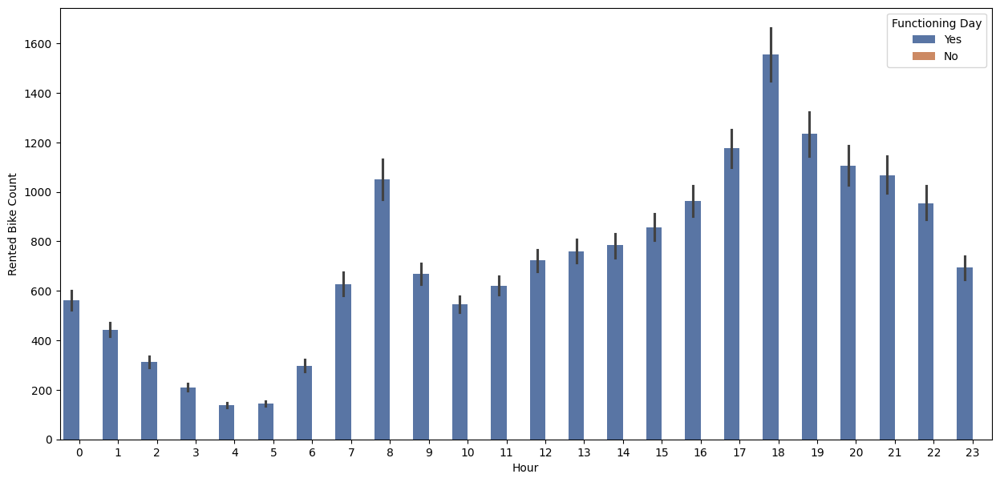

In [ ]:
# traitement jours de fonctionnement

def barplots(x,y,hue):
    plt.figure(figsize=(15,7))
    sns.set_palette("deep")
    sns.barplot(x=x,y=y,hue=hue,data=df);
barplots('Hour','Rented Bike Count','Functioning Day')

In [ ]:
# Regroupement par jour de fonctionnement et calcul du nombre total de vélos loués
df.drop('Date', axis=1).groupby('Functioning Day').sum()['Rented Bike Count'].sort_values(ascending = False).reset_index()

,Functioning Day,Rented Bike Count
0,Yes,6172314
1,No,0


Selon le résultat, les vélos ne sont loués que les jours de fonctionnement (Functioning Day). Supprimons donc les jours de non-fonctionnement, puis également la colonne Jour de fonctionnement.

In [ ]:
#Suppression des données des jours non fonctionnels (jours non loués)
df=df.drop(df[df['Functioning Day'] == 'No'].index)

In [ ]:
#En raison d'une erreur dans la colonne Jour de fonctionnement, supprimez la colonne Jour de fonctionnement
df=df.drop(['Functioning Day'], axis = 1)

In [ ]:
#Vérification de la forme du DataFrame après suppression des lignes de jour non fonctionnelles et de la colonne de jour fonctionnelle
print("Dataframe filtré avec uniquement les jours de location de vélo :",df.shape,"\n")

Dataframe filtré avec uniquement les jours de location de vélo : (8465, 13) 



In [ ]:
#Separation Date, Mois, Année de la colonne Date
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

In [ ]:
# supprimer la colonne Date après l'extraction des informations nécessaires
df.drop(columns=['Date'],inplace=True)

In [ ]:
df.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Year,Month,Day
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,2017,12,1
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,2017,12,1
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,2017,12,1
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,2017,12,1
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,2017,12,1


Analyse exploratoire et visualisation

Explorons les données en visualisant la distribution des valeurs dans certaines colonnes de l'ensemble de données, ainsi que les relations entre le nombre de vélos loués et d'autres colonnes. Nous utiliserons les bibliothèques Matplotlib et Seaborn pour la visualisation.

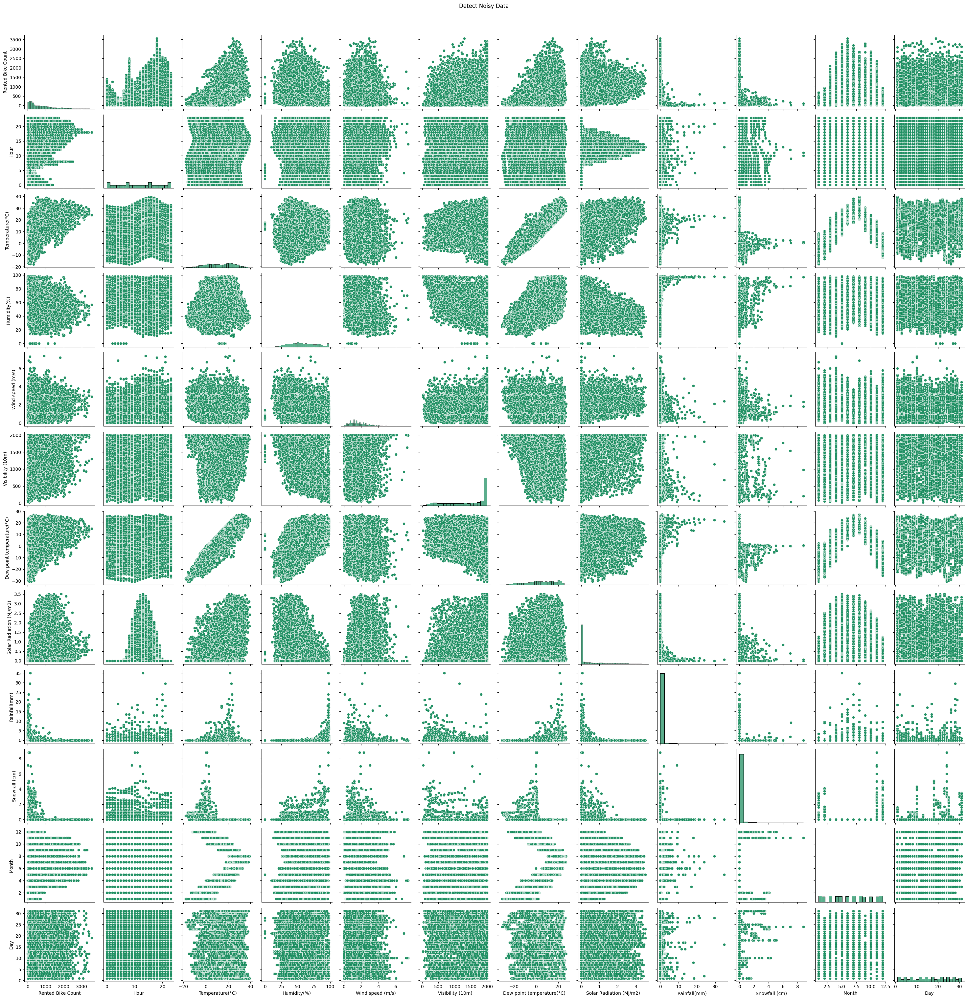

In [ ]:
# Vérification des données bruyantes
%matplotlib inline
sns.set_palette('summer')

# Identify discrete columns
discrete_cols1 = [col for col in df.columns if df[col].nunique() < 10]

dnp = sns.pairplot(df.loc[:, ~df.columns.isin(discrete_cols1)])
dnp.fig.suptitle('Detect Noisy Data', y=1.02)

plt.show()

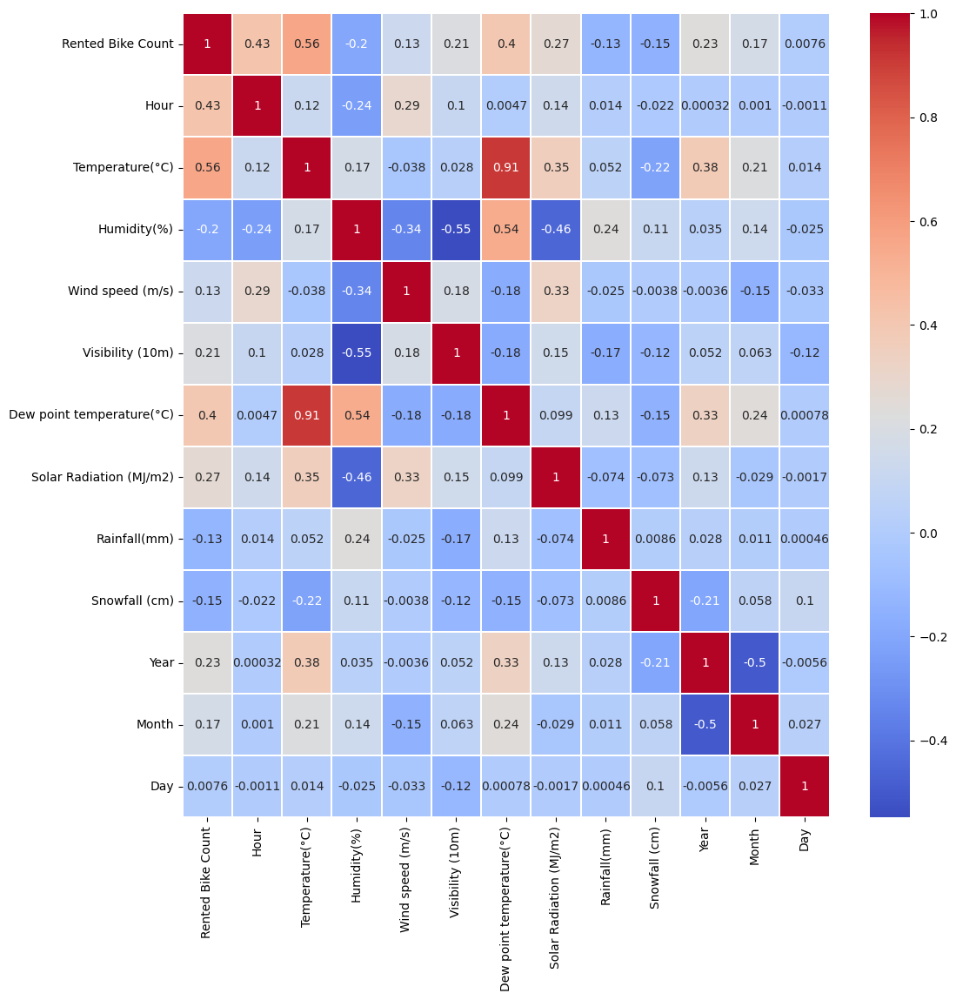

In [ ]:
#Vérification de la corrélation des données
#.corr() use to find correlation with data

# Drop non-numeric columns before calculating correlation
numeric_df = df.select_dtypes(include=np.number)
data_corr= numeric_df.corr()
plt.figure(figsize=(12,12))

#cmap use for colour palette , linewidths : set the width of the lines that divide the cells,
#annot :helps in annotating the heatmap with values if set to True, otherwise values are not provided , linecolor : helps in setting the color of each line that divides heatmap cells
sns.heatmap(data_corr, cmap='coolwarm', linewidths=0.1, annot=True, linecolor='white')
plt.show()

La température et la température du point de rosée sont presque corrélées à 0,91…

ça veut dire que si on calcule le coefficient de corrélation entre les deux colonnes (par exemple avec df.corr()), on obtient 0,91, ce qui est très proche de 1.

1 = corrélation parfaite positive (les deux variables évoluent exactement ensemble)
* Dans certains modèles statistiques ou de machine learning (comme la régression linéaire), avoir deux variables fortement corrélées provoque ce qu’on appelle la multicolinéarité.
Cela rend le modèle instable car il ne sait pas laquelle des deux utiliser pour expliquer la variation de la variable cible.
* Si deux variables apportent quasiment la même information, en garder une seule simplifie le modèle et évite la redondance.
Ici, la température du point de rosée est presque un duplicata de la température réelle, donc on la supprime.

In [ ]:
#Drop Dew point temperature(°C) from dataset df
df.drop(columns=['Dew point temperature(°C)'],inplace=True)

Remarque: Nous constatons qu'avec notre variable cible /Target (nombre de vélos loués), les variables les plus corrélées sont : l'heure, la température et la température du point de rosée.

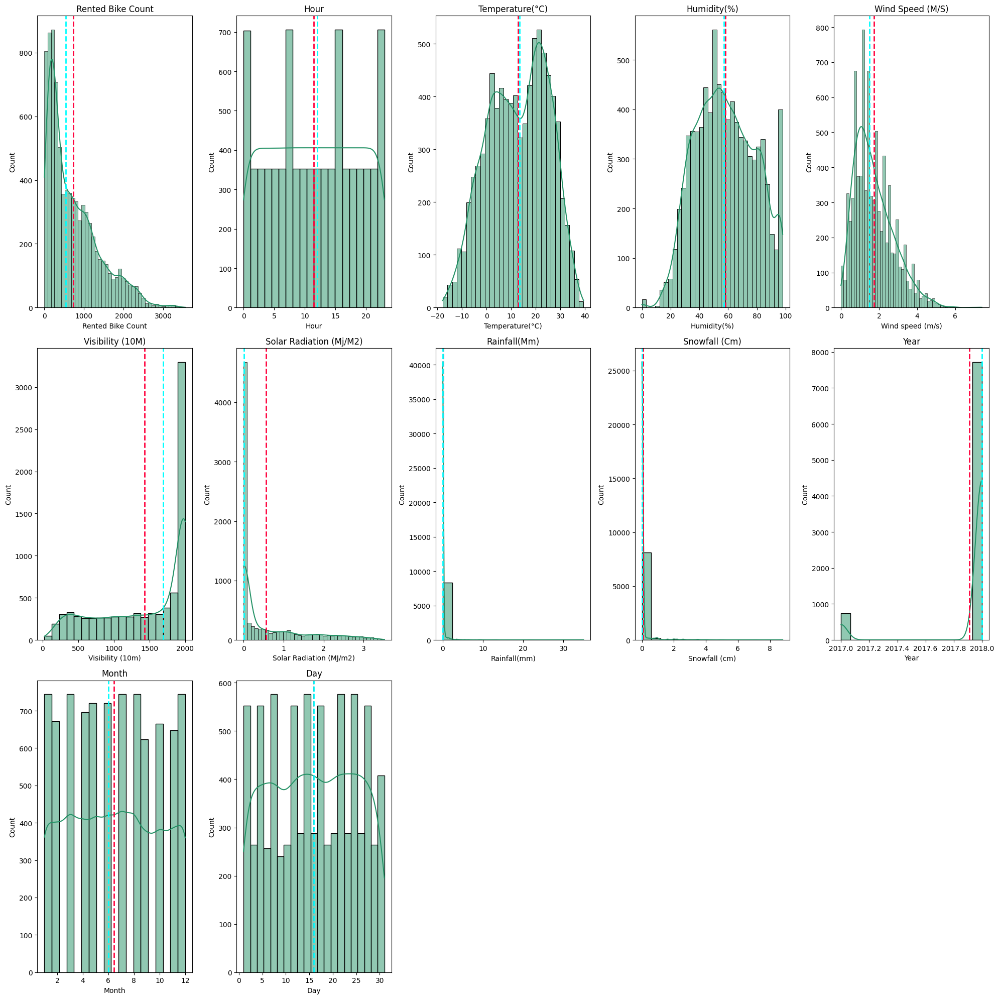

In [ ]:
#plot num data to analysis data distribution
fig = plt.figure(figsize = (20,20))
numerical_features = df.select_dtypes(include=np.number).columns

for index,column in enumerate(numerical_features) :
  plt.subplot(3,5,index+1)
  sns.histplot(df[column], kde=True) # Changed distplot to histplot as distplot is deprecated
  feature = df[column]
  ax = fig.gca()
  ax.axvline(feature.mean(), color='#ff033e', linestyle='dashed', linewidth=2)  #Rose-Red Color indicate mean of data
  ax.axvline(feature.median(), color='#00ffff', linestyle='dashed', linewidth=2) #Cyan indicate median of data
  plt.title(f'{column.title()}')
  plt.tight_layout()
plt.show()

Analysons les valeurs discrètes en créant des histogrammes pour comprendre la distribution

In [ ]:
#For categorical Data
categorical_features=[col for col in df.columns if df[col].dtype=='O']
categorical_features

['Seasons', 'Holiday']

In [ ]:
# Seprate dataframe for Categorical feature
cat_data=df[categorical_features]

In [ ]:
# Unique number of categorical features
for feature in categorical_features:
    print('The feature is {} and number of categories are {}'.format(feature,len(df[feature].unique())))

The feature is Seasons and number of categories are 4
The feature is Holiday and number of categories are 2


In [ ]:
# GROUPING BY SEASONS AND CALCULATING THE TOTAL RENTED BIKE COUNT
df.groupby('Seasons').sum()['Rented Bike Count'].sort_values(ascending = False).reset_index()

,Seasons,Rented Bike Count
0,Summer,2283234
1,Autumn,1790002
2,Spring,1611909
3,Winter,487169


In [ ]:
# GROUPING BY HOLIDAY AND CALCULATING THE TOTAL RENTED BIKE COUNT
df.groupby('Holiday').sum()['Rented Bike Count'].sort_values(ascending = False).reset_index()

,Holiday,Rented Bike Count
0,No Holiday,5956419
1,Holiday,215895


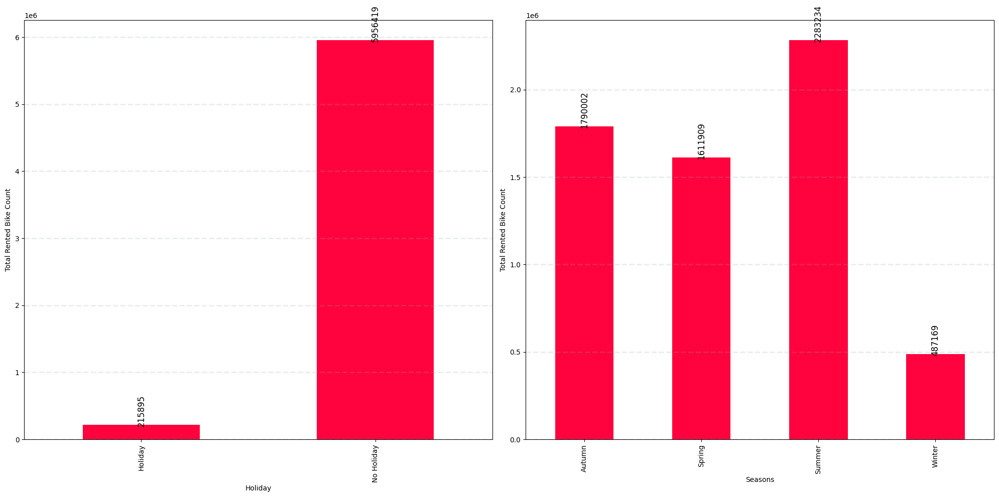

In [ ]:
#Find out the relationship between categorical variable and dependent feature Rented Bike Count

fig = plt.figure(figsize = (20,10))
for index,column in enumerate(categorical_features) :
    plt.subplot(1,2,index+1)
    dataset=df.copy()
    dataset.groupby(feature)['Rented Bike Count'].sum().plot(kind='bar',color="#ff033e")
    feature = df[column]
    ax = fig.gca()
    plt.ylabel('Total Rented Bike Count')
    plt.tight_layout()
    plt.grid(color='#95a5a6', linestyle='--', linewidth=2, axis='y', alpha=0.2)
    for p in ax.patches:
        ax.annotate(round(p.get_height()),(p.get_x() + p.get_width()/2,p.get_height()),ha='center',size= 12, rotation=90)

Object Variables Count: 2


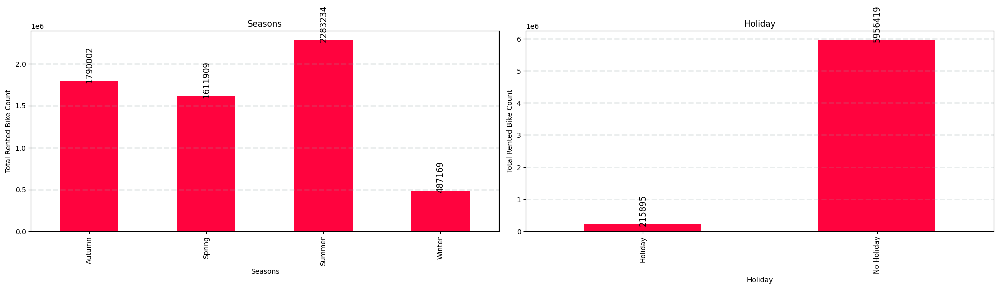

In [ ]:
# Sélection des colonnes objets
object_features = [col for col in df.columns if df[col].dtype == 'object']

print("Object Variables Count:", len(object_features))

fig = plt.figure(figsize=(20, 10))

for index, column in enumerate(object_features):
    plt.subplot(2, 2, index + 1)
    dataset = df.copy()

    dataset.groupby(column)['Rented Bike Count'].sum().plot(kind='bar', color="#ff033e")

    ax = plt.gca()
    plt.title(column)
    plt.ylabel('Total Rented Bike Count')
    plt.tight_layout()
    plt.grid(color='#95a5a6', linestyle='--', linewidth=2, axis='y', alpha=0.2)

    for p in ax.patches:
        ax.annotate(round(p.get_height()),
                    (p.get_x() + p.get_width()/2, p.get_height()),
                    ha='center', size=12, rotation=90)

plt.show()


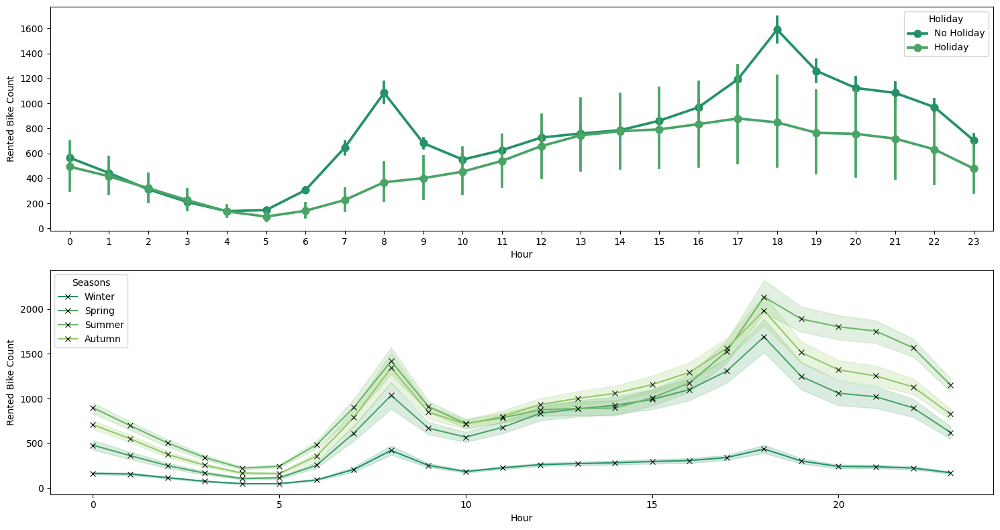

In [ ]:
fig, axs = plt.subplots(nrows=2,ncols=1,figsize=(15,8), dpi=100)
sns.pointplot(data=dataset, x="Hour", y="Rented Bike Count", ax=axs[0],
              hue="Holiday")
sns.lineplot(data=dataset, x="Hour", y="Rented Bike Count", ax=axs[1],
              hue="Seasons", marker="x",markeredgecolor="black")
plt.tight_layout()

# Phase 2 Regroupement de données et construction de modèles

* Ecodage des données cattégorielles
* Identification des features et Target
* Scale /Mettre à l'échelle les valeurs des colonnes numériques dans une plage (0,1)
* Split the dataset into training and validation sets.

Encodage des données catégorielles dans les deux encodeurs et vérification de leur précision :
Les modèles de machine learning ne pouvant être entraînés qu'avec des données numériques, nous devons convertir les données catégorielles en nombres.
* oh_df : Données OneHotEncoder
* le_df : Données LabelEncoder

In [ ]:
# Encodage des données catégorielles
#oh_df=pd.get_dummies(df, columns=['Seasons', 'Holiday'], drop_first=True)
#oh_df

Le OneHotEncoder augmente considérablement le nombre de colonnes.

In [ ]:
# Encode labels of multiple columns at ones using LabelEncoder
from sklearn.preprocessing import LabelEncoder

le_df= df.apply(LabelEncoder().fit_transform)
le_df

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Year,Month,Day
0,252,0,111,28,22,1779,0,0,0,3,1,0,11,0
1,202,1,108,29,8,1779,0,0,0,3,1,0,11,0
2,171,2,103,30,10,1779,0,0,0,3,1,0,11,0
3,105,3,101,31,9,1779,0,0,0,3,1,0,11,0
4,76,4,103,27,23,1779,0,0,0,3,1,0,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,990,19,205,25,26,1673,0,0,0,0,1,1,10,29
8756,754,20,197,28,23,1779,0,0,0,0,1,1,10,29
8757,685,21,189,30,3,1747,0,0,0,0,1,1,10,29
8758,703,22,184,32,10,1639,0,0,0,0,1,1,10,29


In [ ]:
df.groupby("Seasons").count()  #for checking raw data

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Year,Month,Day
Seasons,,,,,,,,,,,,,
Autumn,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937
Spring,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160
Summer,2208,2208,2208,2208,2208,2208,2208,2208,2208,2208,2208,2208,2208
Winter,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160


In [ ]:
le_df.groupby('Seasons').count() #Seasons convert to numerical after apply transformation on data

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Year,Month,Day
Seasons,,,,,,,,,,,,,
0,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937
1,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160
2,2208,2208,2208,2208,2208,2208,2208,2208,2208,2208,2208,2208,2208
3,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160,2160


0 : Autumn , 1 : Spring , 2 : Summer , 3 : Winter

Checking Ditrubutation and Outliner on DataFrame

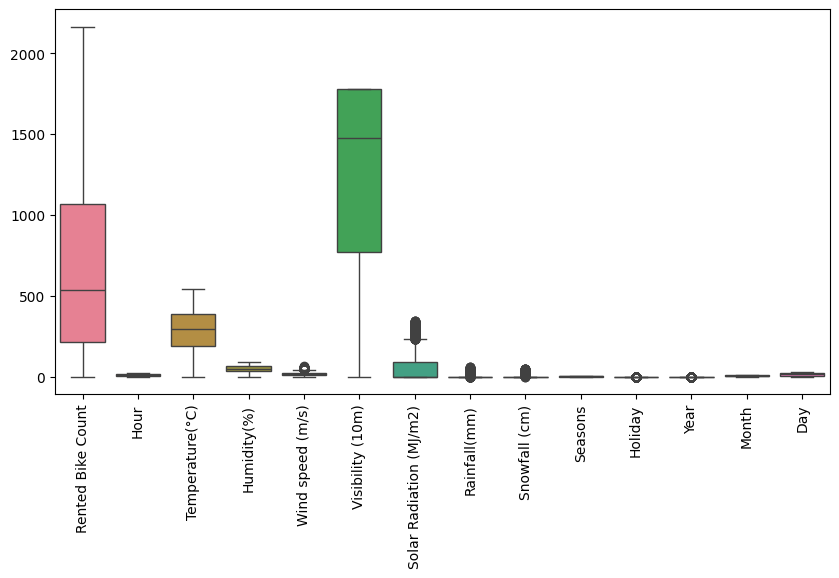

In [ ]:
#checking for outliers
plt.figure(figsize=(10,5))   # for define chart size
plt.xticks(rotation =90)     #plot X-axis ticks in 90 degree rotation for clear visible
sns.boxplot(data = le_df)    #box plot of le_df data frame raw data
plt.show()

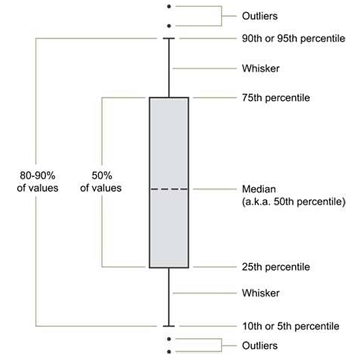

Analyse de la distribution du nombre de vélos loués selon les paramètres cibles

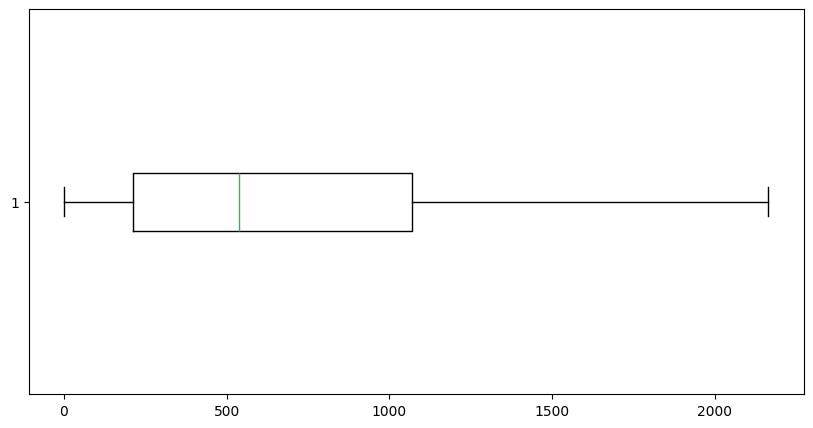

In [ ]:
plt.figure(figsize=(10,5))
plt.boxplot(le_df['Rented Bike Count'],vert=False)
plt.show()

Square Root Transformation (√y)

* Utilisée lorsque les données sont modérément asymétriques à droite (moderately right skewed).

* Transformation modérée qui réduit la skewness mais conserve globalement la forme de la distribution.

* Peut être appliquée sur des valeurs zéro.

* Souvent utilisée pour des données counted data (données de comptage, comme des fréquences).

Log Transformation (log(y))

* Transformation forte qui a un impact important sur la forme de la distribution.

* Très efficace pour réduire une right skewness importante.

* Ne peut pas être appliquée aux valeurs zéro ou négatives.

* Recommandée pour des données strictement positives.

Cube Root Transformation (y^(1/3))

* Transformation modérée à forte, moins puissante que le log mais plus forte que le square root.

* Peut être appliquée aux valeurs négatives et zéro.

* Utilisée pour corriger negative skewness ou positive skewness modérée.

/tmp/ipython-input-4178047683.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot((le_df['Rented Bike Count']),ax=axes[0],color='brown').set_title(" Input data")
/tmp/ipython-input-4178047683.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.log1p(le_df['Rented Bike Count']+0.0000001),ax=ax

Text(0.5, 1.0, 'cube root')

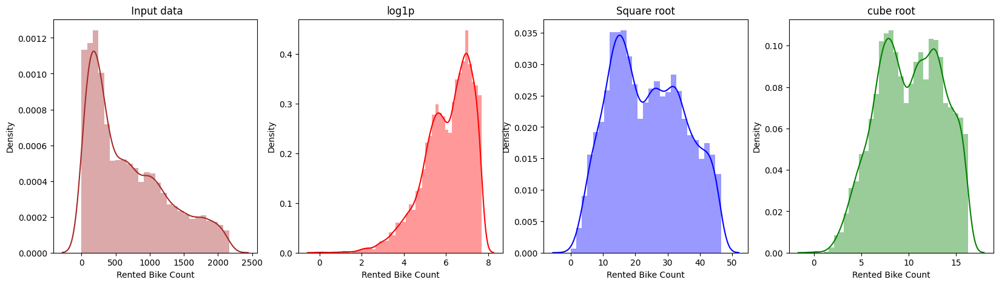

In [ ]:
#apply diffrent tranformation technique and checking data distributation
fig,axes = plt.subplots(1,4,figsize=(20,5))
sns.distplot((le_df['Rented Bike Count']),ax=axes[0],color='brown').set_title(" Input data")
sns.distplot(np.log1p(le_df['Rented Bike Count']+0.0000001),ax=axes[1],color='red').set_title("log1p") #transform only posible in positive value and >0 value so add 0.0000001 in data
sns.distplot(np.sqrt(le_df['Rented Bike Count']),ax=axes[2], color='blue').set_title("Square root")
sns.distplot(np.cbrt(le_df['Rented Bike Count']*2),ax=axes[3], color='green').set_title("cube root")

In [ ]:
# Split train/test
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
import numpy as np

# Define features (X) and target (y)
X = le_df.drop('Rented Bike Count', axis=1)
y = le_df['Rented Bike Count']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Appliquer RobustScaler
scaler = RobustScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Liste des modèles
models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(),
    'Lasso Regression': Lasso(),
    'Random Forest': RandomForestRegressor(random_state=42, n_estimators=100),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42)
}

# Initialiser dataframe pour résultats
results = pd.DataFrame(columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Score'])

# Entraînement et évaluation
for name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)

    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)

    results = pd.concat([results, pd.DataFrame({
        'Model':[name],
        'MAE':[mae],
        'MSE':[mse],
        'RMSE':[rmse],
        'R2 Score':[r2]
    })], ignore_index=True)

# Afficher le tableau comparatif
print(results.sort_values(by='R2 Score', ascending=False))

/tmp/ipython-input-2756180098.py:43: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = pd.concat([results, pd.DataFrame({


               Model         MAE            MSE        RMSE  R2 Score
3      Random Forest  117.324613   36583.039315  191.266932  0.882991
4  Gradient Boosting  139.464159   42929.197165  207.193622  0.862693
1   Ridge Regression  279.731715  125129.017196  353.735801  0.599780
0  Linear Regression  279.742457  125135.201156  353.744542  0.599760
2   Lasso Regression  279.733617  125197.132909  353.832069  0.599562


  Commentaires :
  * Modèles où ce n’est pas nécessaire

- Arbres de décision

- Random Forest

- Gradient Boosting

- XGBoost

Ces modèles sont invariants aux échelles car ils se basent sur des seuils et des séparations, pas sur des distances.

1. Interprétation :

#Random Forest est clairement le meilleur modèle ici :


MAE (erreur absolue moyenne) = 117, le plus bas ⇒ bonne précision globale.

MSE et RMSE aussi les plus faibles ⇒ erreurs moins importantes.

R² ≈ 0.883 ⇒ le modèle explique 88% de la variance des données.

#Gradient Boosting est en deuxième position :

Performances bonnes mais un peu moins précises (MAE et RMSE légèrement plus élevés que Random Forest).

R² ≈ 0.863 ⇒ explique environ 86% de la variance.

Régressions linéaires (Ridge, Lasso, Linear Regression) :

MAE ~ 280 ⇒ deux fois plus d’erreur que Random Forest.

R² ≈ 0.60 ⇒ n’explique que 60% de la variance, donc beaucoup moins adapté au problème.

#2. Explication technique

Les modèles linéaires (Linear, Ridge, Lasso) supposent une relation strictement linéaire entre les variables et la cible. Si les données ont des relations non linéaires ou complexes, ces modèles échouent.

Random Forest et Gradient Boosting captent mieux les relations non linéaires, les interactions entre variables, et gèrent bien les données bruitées.

La différence entre Random Forest et Gradient Boosting est faible, mais Random Forest gagne un peu en robustesse.

#3. Recommandations

* Conserver Random Forest comme modèle principal pour le jeu de données.

# STREAMLIT

installation joblib pour telechargement data pour streamlit

In [ ]:
#Installation bibliothèque joblib
!pip install joblib


In [ ]:
import joblib

In [ ]:
from sklearn.ensemble import RandomForestRegressor
import joblib

# Instancier et entraîner
rf_model = RandomForestRegressor(random_state=42, n_estimators=100)
rf_model.fit(X_train_scaled, y_train)

# Sauvegarder le modèle entraîné
joblib.dump(rf_model, "BestModel.pkl")
print("✅ Modèle Random Forest sauvegardé avec succès.")

✅ Modèle Random Forest sauvegardé avec succès.


In [ ]:
from google.colab import files
files.download("BestModel.pkl")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
joblib.dump(scaler, "Scaler.pkl")


['Scaler.pkl']

In [ ]:

# Sauvegarder la liste des colonnes utilisées
joblib.dump(X_train.columns.tolist(), "features.pkl")


['features.pkl']

In [ ]:
# Vérifie les colonnes utilisées à l'entraînement
print("Colonnes entraînement :", X_train.columns)

# Vérifie les colonnes au moment de la prédiction
print("Colonnes prédiction :", le_df.columns)

# Compare la différence
missing = set(X_train.columns) - set(le_df.columns)
extra = set(le_df.columns) - set(X_train.columns)
print("Manquantes :", missing)
print("En trop :", extra)

Colonnes entraînement : Index(['Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
       'Visibility (10m)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)',
       'Snowfall (cm)', 'Seasons', 'Holiday', 'Year', 'Month', 'Day'],
      dtype='object')
Colonnes prédiction : Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Solar Radiation (MJ/m2)',
       'Rainfall(mm)', 'Snowfall (cm)', 'Seasons', 'Holiday', 'Year', 'Month',
       'Day'],
      dtype='object')
Manquantes : set()
En trop : {'Rented Bike Count'}


In [ ]:
import joblib
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.ensemble import RandomForestRegressor

# Create a pipeline with the scaler and the model
pipeline = Pipeline([
    ('scaler', RobustScaler()),
    ('regressor', RandomForestRegressor(random_state=42, n_estimators=100))
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Save the trained pipeline
joblib.dump(pipeline, "BikePipeline.pkl")

print("✅ Pipeline saved successfully.")

from google.colab import files
files.download("BikePipeline.pkl")

✅ Pipeline saved successfully.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

CODE STREAMLIT

In [ ]:
import streamlit as st
import pandas as pd
import joblib
import os

# 📂 Chemin vers modèle
model_path = r"C:\Users\User\PycharmProjects\PythonProjects\BIKE_EDA\BikePipeline.pkl"

# Charger le modèle (pipeline complet)
model = joblib.load(model_path)

# Récupérer la liste exacte des colonnes attendues par le modèle
feature_names = model.feature_names_in_

st.title("🚴 Prédiction de la demande de vélos - Séoul")

# Mappings pour les variables catégorielles
season_map = {"Winter": 3, "Spring": 2, "Summer": 0, "Autumn": 1}
holiday_map = {"No": 0, "Yes": 1}

# Création d'un DataFrame vide avec toutes les colonnes attendues
input_data = pd.DataFrame(columns=feature_names)
input_data.loc[0] = 0  # Initialise toutes les valeurs à 0

# 🎯 Remplir avec les valeurs saisies par l’utilisateur
season = st.selectbox("🌱 Saison", list(season_map.keys()))
holiday = st.radio("🎉 Jour férié ?", list(holiday_map.keys()))
temperature = st.number_input("🌡 Température (°C)", value=10.0)
humidity = st.number_input("💧 Humidité (%)", value=50.0)
wind_speed = st.number_input("🌬 Vitesse du vent (m/s)", value=2.0)
visibility = st.number_input("👀 Visibilité (10m)", value=1500)
solar_radiation = st.number_input("☀️ Rayonnement solaire (MJ/m2)", value=1.5)
rainfall = st.number_input("🌧 Précipitation (mm)", value=0.0)
snowfall = st.number_input("❄️ Neige (cm)", value=0.0)

# 📝 Remplissage des colonnes existantes
if "Seasons" in input_data.columns:
    input_data.loc[0, "Seasons"] = season_map[season]
if "Holiday" in input_data.columns:
    input_data.loc[0, "Holiday"] = holiday_map[holiday]
if "Temperature(°C)" in input_data.columns:
    input_data.loc[0, "Temperature(°C)"] = temperature
if "Humidity(%)" in input_data.columns:
    input_data.loc[0, "Humidity(%)"] = humidity
if "Wind speed (m/s)" in input_data.columns:
    input_data.loc[0, "Wind speed (m/s)"] = wind_speed
if "Visibility (10m)" in input_data.columns:
    input_data.loc[0, "Visibility (10m)"] = visibility
if "Solar Radiation (MJ/m2)" in input_data.columns:
    input_data.loc[0, "Solar Radiation (MJ/m2)"] = solar_radiation
if "Rainfall(mm)" in input_data.columns:
    input_data.loc[0, "Rainfall(mm)"] = rainfall
if "Snowfall (cm)" in input_data.columns:
    input_data.loc[0, "Snowfall (cm)"] = snowfall

#📅 Colonnes temporelles si présentes dans le modèle
if "Year" in input_data.columns:
    input_data.loc[0, "Year"] = st.number_input("📅 Année", value=2020, step=1)
if "Month" in input_data.columns:
    input_data.loc[0, "Month"] = st.number_input("📆 Mois", value=6, min_value=1, max_value=12, step=1)
if "Day" in input_data.columns:
    input_data.loc[0, "Day"] = st.number_input("🗓 Jour", value=15, min_value=1, max_value=31, step=1)
if "Hour" in input_data.columns:
    input_data.loc[0, "Hour"] = st.slider("⏰ Heure", min_value=0, max_value=23, value=12, step=1)


# Vérification des données envoyées au modèle
st.subheader("📊 Données envoyées au modèle :")
st.dataframe(input_data)

# Prédiction
if st.button("🔍 Prédire la demande"):
    prediction = model.predict(input_data)
    st.success(f"📈 Nombre de vélos prédit : **{int(prediction[0])}**")
